In [1]:
%matplotlib inline

import argparse
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import scipy.spatial.distance
import pandas as pd
import seaborn as sns

import torch
import cpc.feature_loader as fl
import cpc.train as tr
from cpc.dataset import AudioBatchData, findAllSeqs, filterSeqs, parseSeqLabels

sys.path.append(os.path.dirname(tr.__file__))

import warnings
warnings.filterwarnings('ignore')

In [2]:
no_AR_models = [
    'cpc-kreuk-1neg-ls+buckeye-cosine-norelu',
    'acpc-hierarchical-GTseg-zelazkoarch-cosine-ls100-linOut-encSegments'
]

AR_models = [
    'acpc-baseline-cosine-norelu-ls+buckeye',
    'hacpc-cosine-norelu-kreuk-encodeseg-ls+buckeye', 
    'hacpc-gt-cosine-norelu-encodeseg-ls'
]

In [3]:
phones2codes = {  # phonemes which should be the same for TIMIT
    'a': 0, 'aa': 1, 'aan': 2, 'ae': 3, 'aen': 4, 'ah': 0, 'ahn': 5, 'an': 5, 
    'ao': 6, 'aon': 7, 'aw': 8, 'awn': 9, 'ay': 10, 'ayn': 11, 'b': 12, 'ch': 13, 
    'd': 14, 'dh': 15, 'dx': 16, 'eh': 17, 'ehn': 18, 'el': 19, 'em': 20, 'en': 21, 
    'eng': 22, 'er': 23, 'ern': 24, 'ey': 25, 'eyn': 26, 'f': 27, 'g': 28, 'h': 29, 
    'hh': 29, 'hhn': 30, 'i': 31, 'id': 31, 'ih': 31, 'ihn': 32, 'iy': 33, 'iyih': 32, 
    'iyn': 32, 'jh': 34, 'k': 35, 'l': 36, 'm': 37, 'n': 38, 'ng': 39, 'nx': 40, 
    'ow': 41, 'own': 42, 'oy': 43, 'oyn': 44, 'p': 45, 'q': 46, 'r': 47, 's': 48, 
    'sh': 49, 't': 50, 'th': 51, 'tq': 46, 'uh': 52, 'uhn': 53, 'uw': 54, 'uwix': 54, 
    'uwn': 55, 'v': 56, 'w': 57, 'y': 58, 'z': 59, 'zh': 60, '-': 61, '#': 62,
    'x': 63, 'no': 64
}

codes2phones = {v: k for k, v in phones2codes.items()}

In [11]:
def plot_clustered_vows_n_cons(encodings, cont_encodings, labels, codes2phones_dict, mod, avg=False):

    numClasses2Plot = 18 if not avg else 15
    if avg:
        non_hash_idx = labels != 62
        encodings = encodings[non_hash_idx]
        cont_encodings = cont_encodings[non_hash_idx]
        labels = labels [non_hash_idx]
    classes2Keep = pd.Series(labels).value_counts().index[:numClasses2Plot].tolist()

    idxs2Keep = []
    for i in range(len(labels)):
        if labels[i] in classes2Keep or (codes2phones_dict[labels[i].item()] in ['l', 'z']):
            idxs2Keep.append(i)

    x = encodings[idxs2Keep, :]
    x_cont = cont_encodings[idxs2Keep, :]
    y = labels[idxs2Keep]

    idxs2Keep_cons = []
    idxs2Keep_vows = []
    for i in range(len(y)):
        if codes2phones_dict[y[i].item()] in ['r', 'l', 'm', 'n', 'd', 't', 'k', 'f', 'z', 's']:
            idxs2Keep_cons.append(i)
        elif codes2phones_dict[y[i].item()][0] in ['a', 'e', 'i', 'o', 'u', 'y']:
            idxs2Keep_vows.append(i)

    v = x[idxs2Keep_vows, :]
    v_cont = x_cont[idxs2Keep_vows, :]
    y_v = y[idxs2Keep_vows]

    c = x[idxs2Keep_cons, :]
    c_cont = x_cont[idxs2Keep_cons, :]
    y_c = y[idxs2Keep_cons]
    
    numClasses2Plot = len(np.unique(y))

    z_c = []
    for i in range(len(y_c)):
        z_c.append(codes2phones_dict[y_c[i].item()])

    z_v = []
    for i in range(len(y_v)):
        z_v.append(codes2phones_dict[y_v[i].item()])

    fig, axs = plt.subplots(1, 2, figsize=(16, 8), dpi=150, sharey=True)
    fig.subplots_adjust(wspace = .0)
    axs = axs.ravel()
    sns.scatterplot(c[:,0], c[:,1], hue=z_c, legend='full', palette=sns.color_palette("bright", len(set(z_c))), ax=axs[0])
    axs[0].set_title('Encodings')

    sns.scatterplot(c_cont[:,0], c_cont[:,1], hue=z_c, legend='full', palette=sns.color_palette("bright", len(set(z_c))), ax=axs[1])
    axs[1].set_title('Context Vectors')
    fig.suptitle(mod)
    plt.show()


    fig, axs = plt.subplots(1, 2, figsize=(16, 8), dpi=150, sharey=True)
    fig.subplots_adjust(wspace = .0)
    axs = axs.ravel()
    sns.scatterplot(v[:,0], v[:,1], hue=z_v, legend='full', palette=sns.color_palette("bright", len(set(z_v))), ax=axs[0])
    axs[0].set_title('Encodings')

    sns.scatterplot(v_cont[:,0], v_cont[:,1], hue=z_v, palette=sns.color_palette("bright", len(set(z_v))), ax=axs[1])
    axs[1].set_title('Context Vectors')
    fig.suptitle(mod)
    plt.show()



In [5]:
def plot_cons_vows_comp(encodings, cont_encodings, labels, codes2phones_dict, mod):

    numClasses2Plot = 18
    classes2Keep = pd.Series(labels).value_counts().index[:numClasses2Plot].tolist()

    idxs2Keep = []
    for i in range(len(labels)):
        if labels[i] in classes2Keep or (codes2phones_dict[labels[i].item()] in ['l', 'z']):
            idxs2Keep.append(i)

    x = encodings[idxs2Keep, :]
    x_cont = cont_encodings[idxs2Keep, :]
    y = labels[idxs2Keep]

    idxs2Keep_cons = []
    idxs2Keep_vows = []
    for i in range(len(y)):
        if codes2phones_dict[y[i].item()][0] not in ['a', 'e', 'i', 'o', 'u', 'y']:
            idxs2Keep_cons.append(i)
        else:
            idxs2Keep_vows.append(i)

    v = x[idxs2Keep_vows, :]
    v_cont = x_cont[idxs2Keep_vows, :]
    c = x[idxs2Keep_cons, :]
    c_cont = x_cont[idxs2Keep_cons, :]

    fig, axs = plt.subplots(1, 2, figsize=(16, 8), dpi=150, sharey=True)
    fig.subplots_adjust(wspace = .0)
    fig.suptitle(mod)
    axs = axs.ravel()

    axs[0].scatter(v[:,0], v[:,1], color='forestgreen', label='vowels', alpha=0.5)
    axs[0].scatter(c[:,0], c[:,1], color='red', label='consonants', alpha=0.5)
    axs[0].legend()
    axs[0].set_title('Encodings')

    axs[1].scatter(v_cont[:,0], v_cont[:,1], color='forestgreen', label='vowels', alpha=0.5)
    axs[1].scatter(c_cont[:,0], c_cont[:,1], color='red', label='consonants', alpha=0.5)
    axs[1].set_title('Context Vectors')

    plt.show()

In [6]:
def plot_vectors(encodings, labels, phones2codes_dict, letters):

    fig, axs = plt.subplots(1, len(letters), figsize=(15, 2), dpi=100, sharey=True)
    fig.subplots_adjust(wspace = .0)
    axs = axs.ravel()

    for p in range(len(letters)):
        phn_encodings = encodings[labels == phones2codes_dict[letters[p]]]
        X = np.arange(0, phn_encodings.shape[0])
        Y = np.arange(0, 256)
        X, Y = np.meshgrid(X, Y)
        phn_encodings = phn_encodings / np.sqrt((phn_encodings**2).sum(1, keepdims=True))
        Z = phn_encodings.reshape(phn_encodings.shape[0], phn_encodings.shape[1]).T
        axs[p].contourf(X, Y, Z, 10)
        axs[p].set_title(letters[p])
    plt.show()

In [7]:
CP = '/pio/scratch/1/i325922/wav2vec/runs/cpc/acpc-baseline-cosine-norelu-ls+buckeye/checkpoint_49.pt'
cdata = fl.getCheckpointData(os.path.dirname(CP))
_, _, args = cdata
args.pathDB = ['/pio/scratch/1/i323106/data/BUCKEYE/test/']
args.pathPhone = '/pio/scratch/1/i323106/data/BUCKEYE/converted_aligned_phones.txt'
args.size_window = 20480
args.file_extension = ['.wav']

seqNames, speakers = findAllSeqs(args.pathDB,
                                extension=args.file_extension,
                                loadCache=not args.ignore_cache)
phone_labels, n_phones = parseSeqLabels(args.pathPhone)

seq_val = seqNames[:1]
db_val = AudioBatchData(args.pathDB, args.size_window, seq_val,
                        phone_labels, len(speakers))

5it [00:00, 2800.68it/s]


Ran in an error while saving /pio/scratch/1/i323106/data/BUCKEYE/test/_seqs_cache.txt: [Errno 13] Permission denied: '/pio/scratch/1/i323106/data/BUCKEYE/test/_seqs_cache.txt'


1it [00:00, 19239.93it/s]

Checking length...
Done, elapsed: 0.002 seconds
Scanned 1 sequences in 0.00 seconds
1 chunks computed


Joining pool
Joined process, elapsed=0.037 secs


In [8]:
valLoader = db_val.getDataLoader(1, 'sequential', False, numWorkers=0)
labels = []
for batchData, label in valLoader:
    labels.append(label['phone'].squeeze())
labels = torch.cat(labels)

In [9]:
diffs = torch.diff(labels)
phoneChanges = torch.cat((torch.ones(1), diffs), dim=-1)
boundaries = torch.nonzero(phoneChanges.contiguous().view(-1), as_tuple=True)[0]
bin_boundaries = phoneChanges != 0
cumsum_boundaries = torch.cumsum(bin_boundaries, dim=-1)
N_segments = bin_boundaries.sum()

U = torch.arange(1, N_segments+1).view(-1, N_segments).expand(bin_boundaries.shape[0], -1)
V = U - cumsum_boundaries.view(bin_boundaries.shape[0], -1)
W = 1 - torch.tanh(100000 * abs(V))
phoneLengths = torch.sum(W, dim=0)
W /= torch.sum(W, dim=0)

avgLabels = torch.unique_consecutive(labels)

# AR MODELS



Full Resolution Frames
--------------------------------------------------




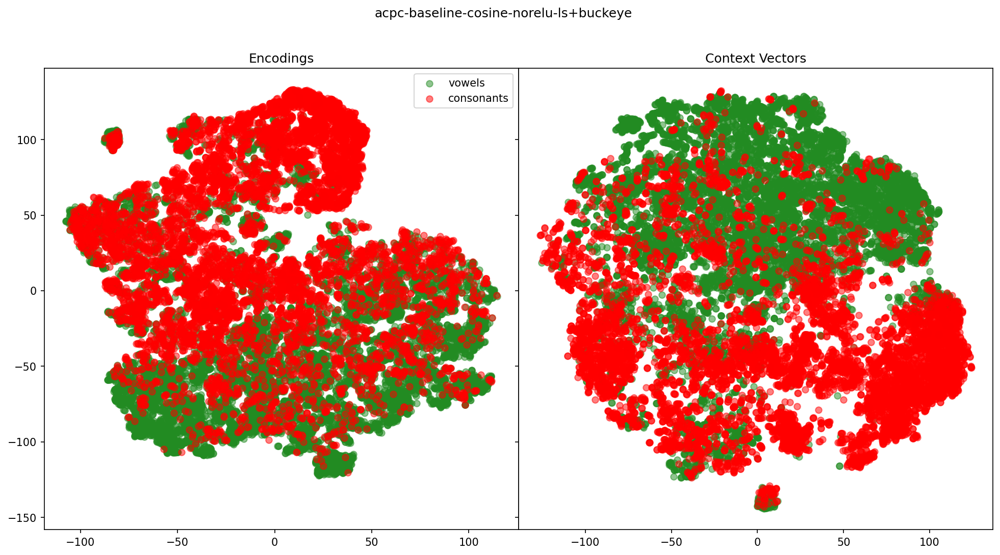

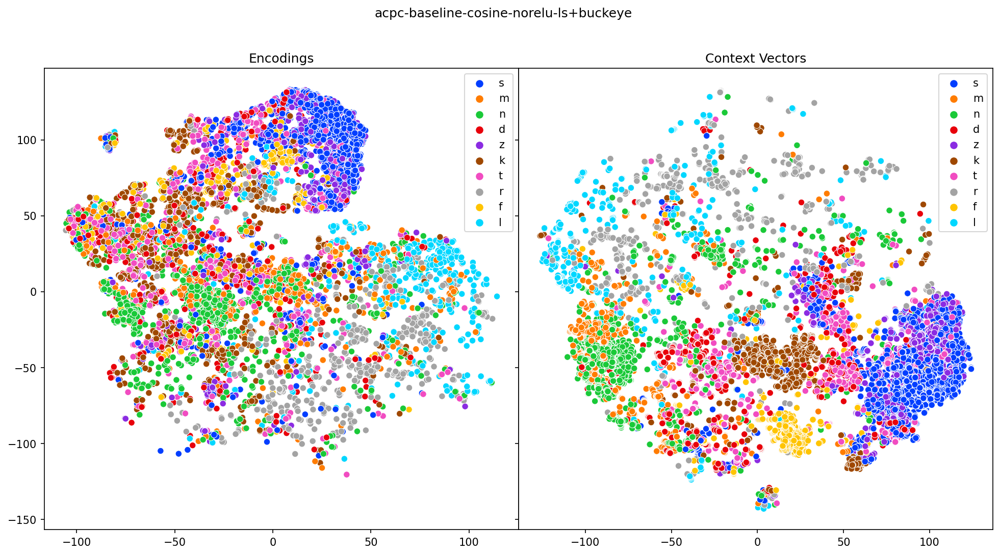

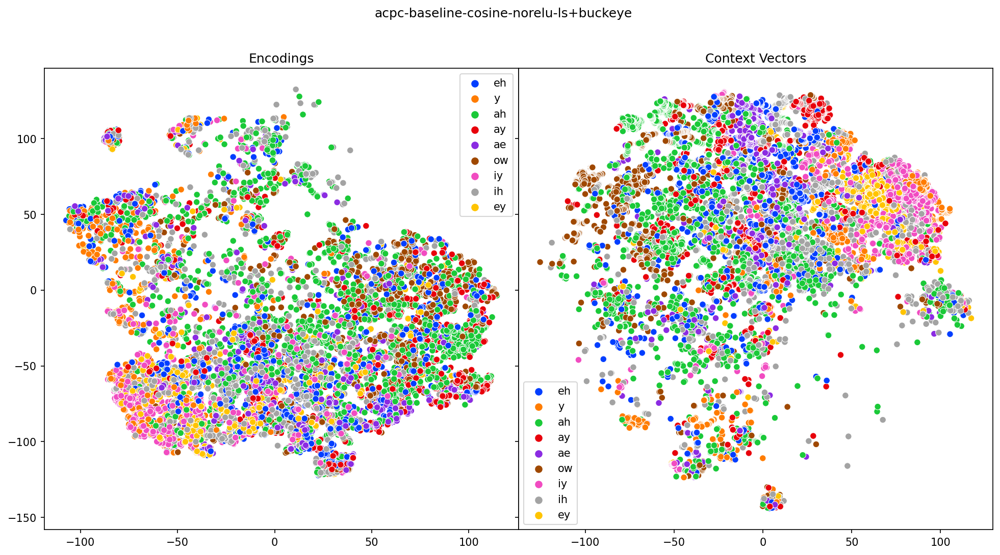



Averaged Segments
--------------------------------------------------




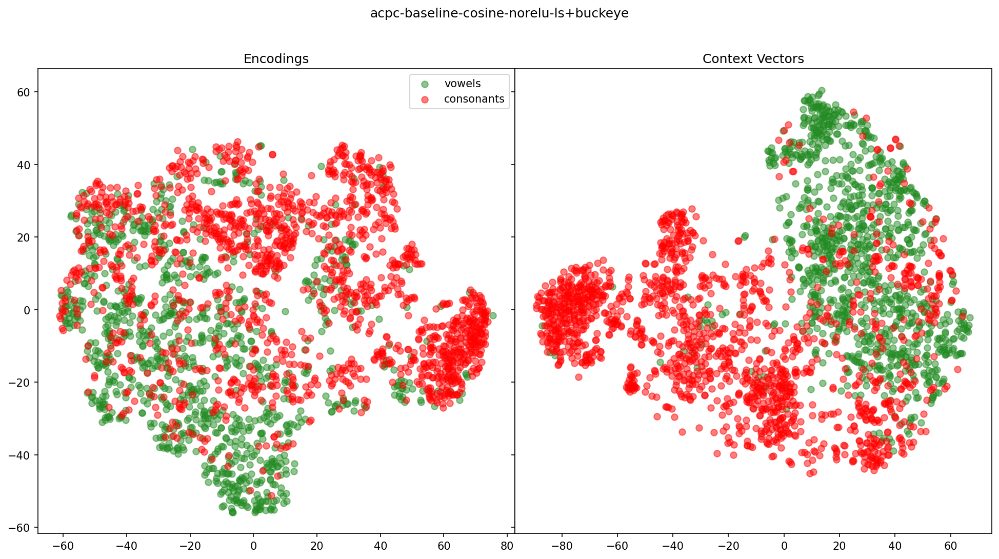

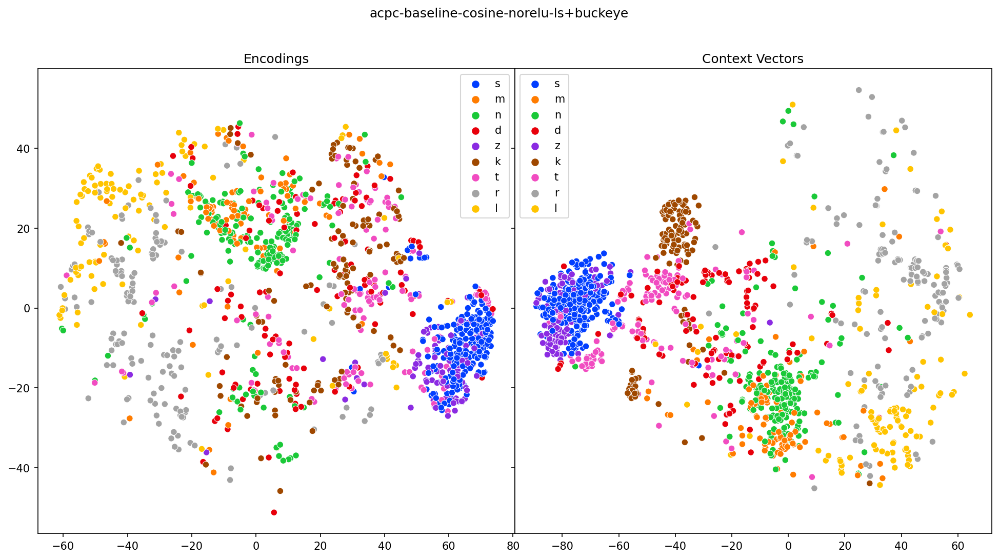

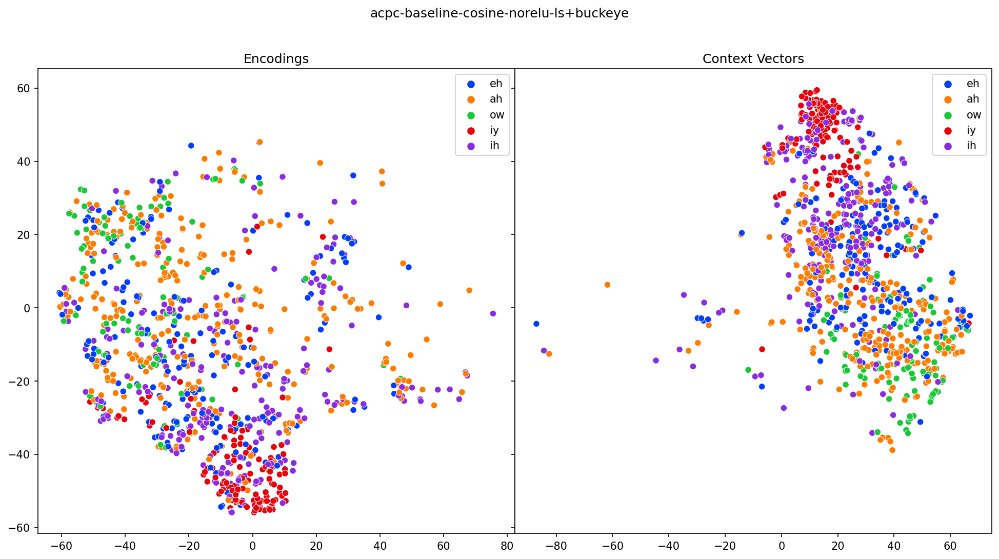



Full Resolution Frames
--------------------------------------------------




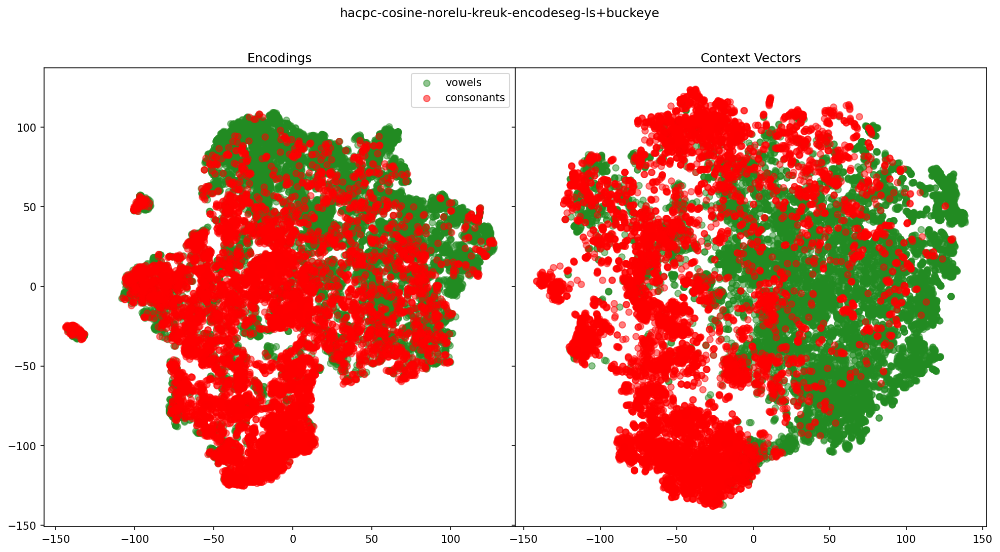

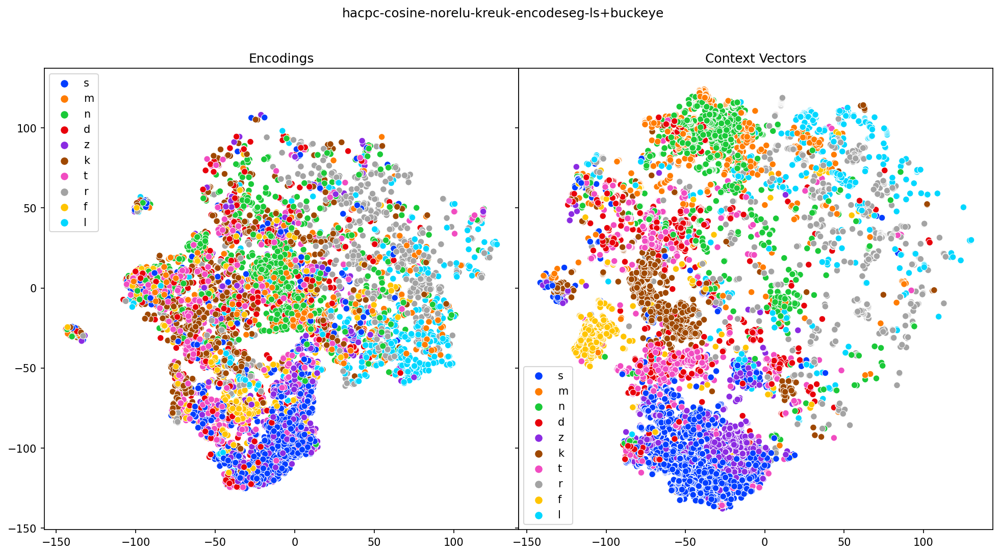

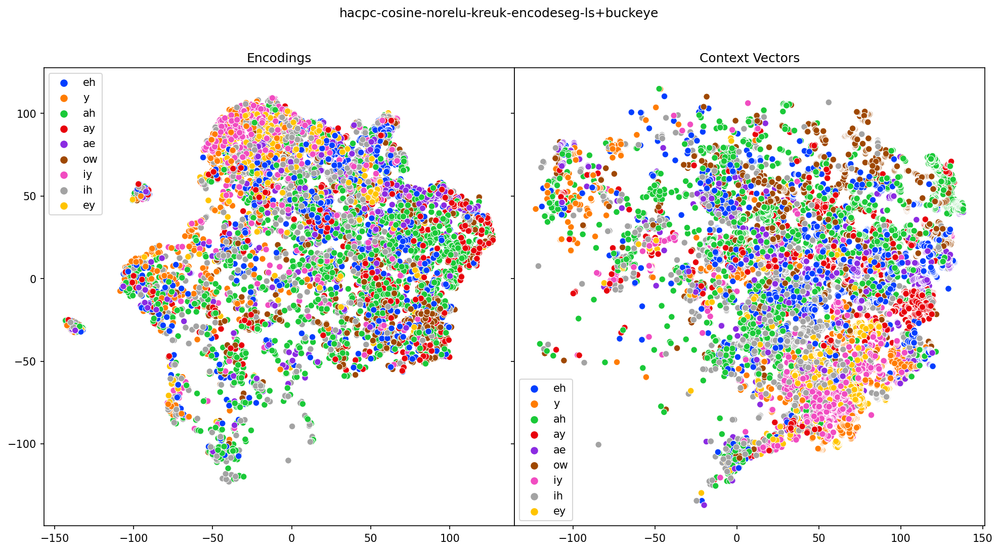



Averaged Segments
--------------------------------------------------




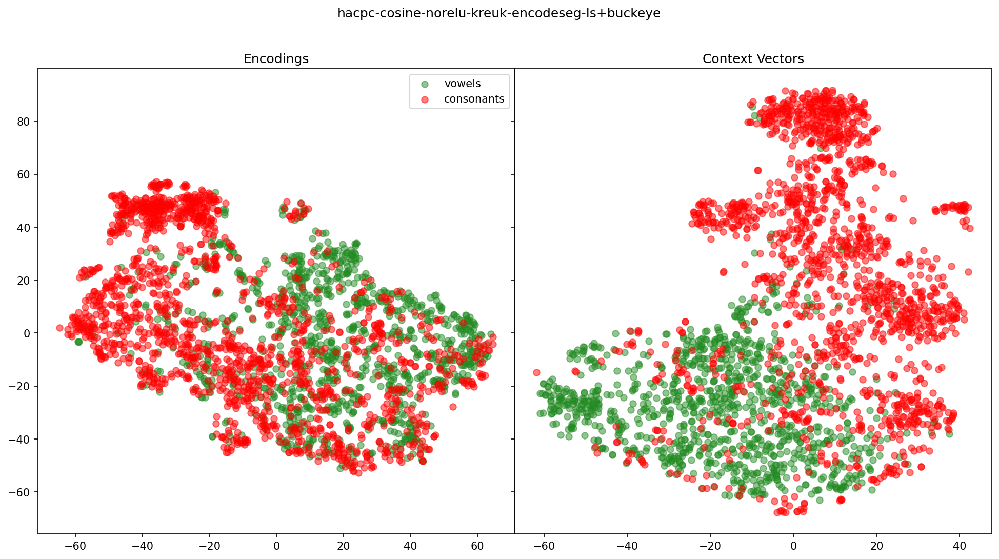

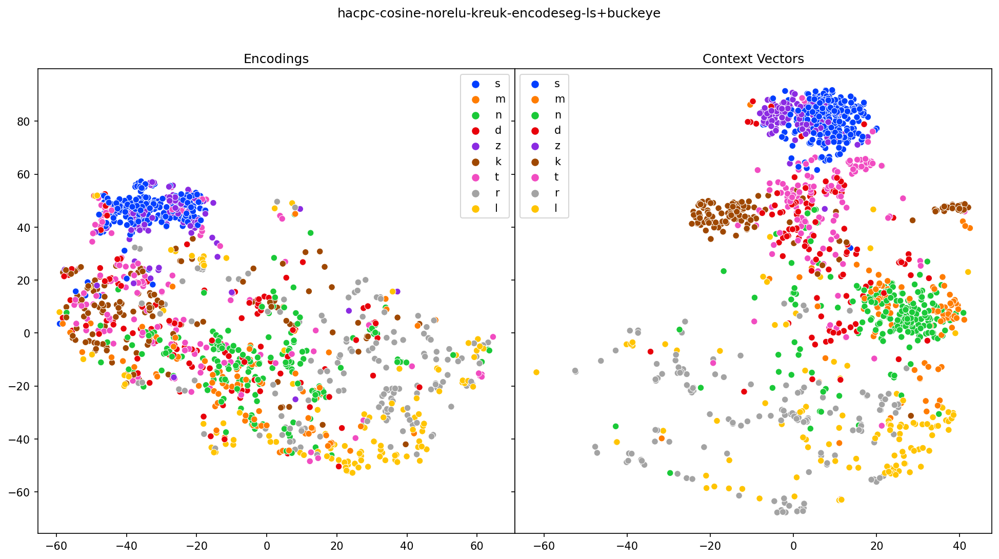

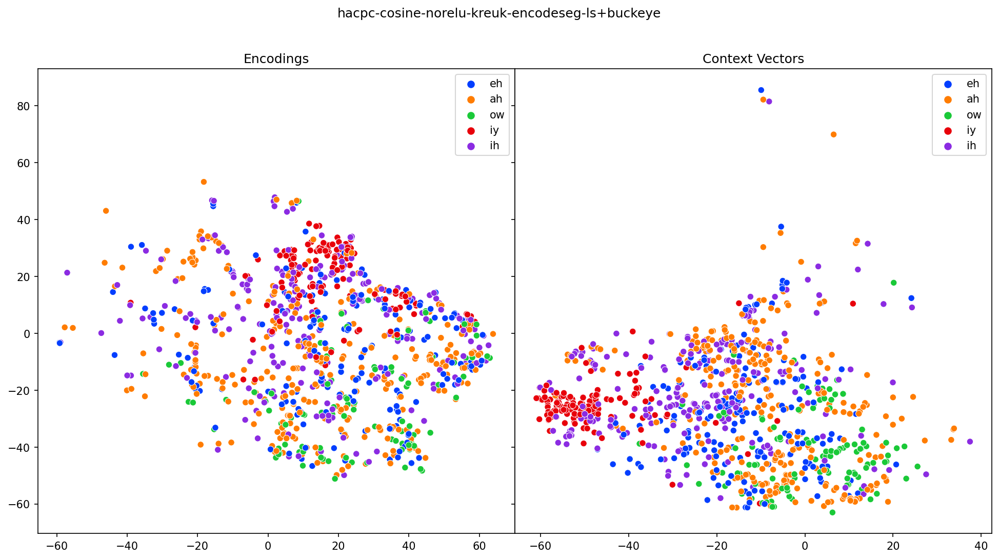



Full Resolution Frames
--------------------------------------------------




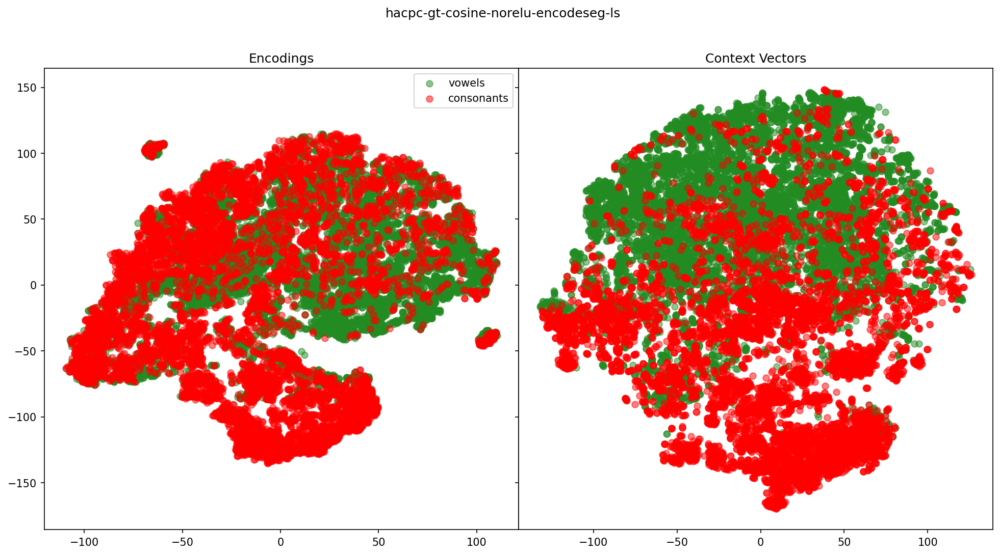

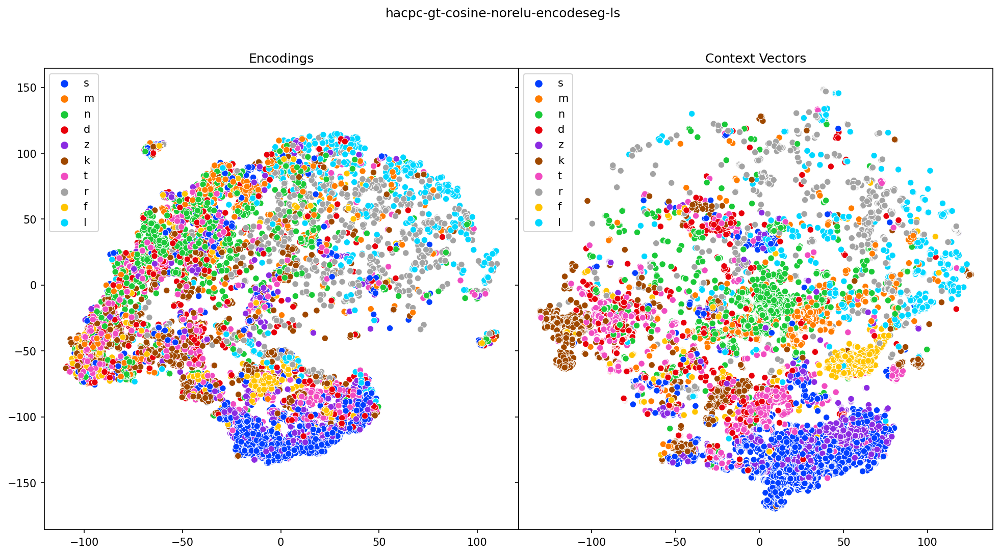

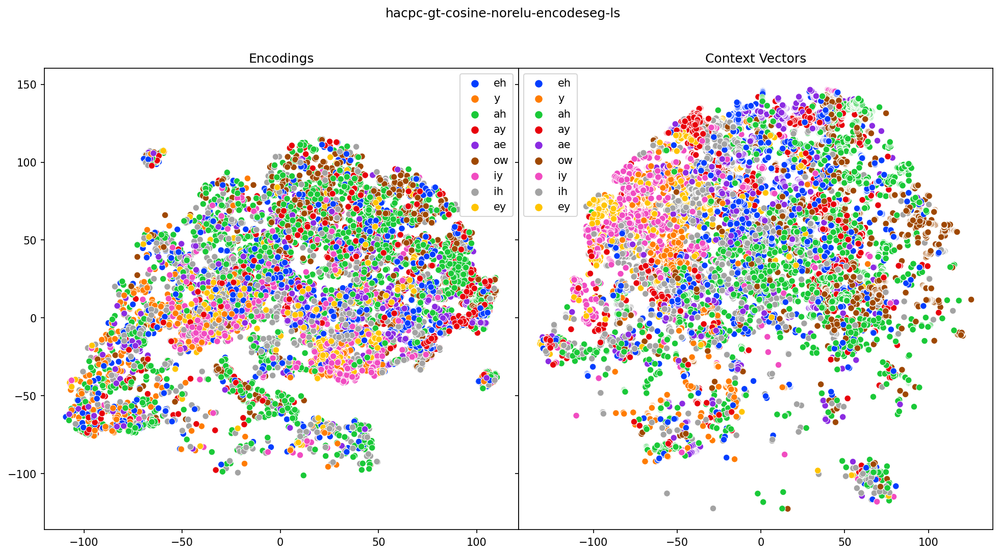



Averaged Segments
--------------------------------------------------




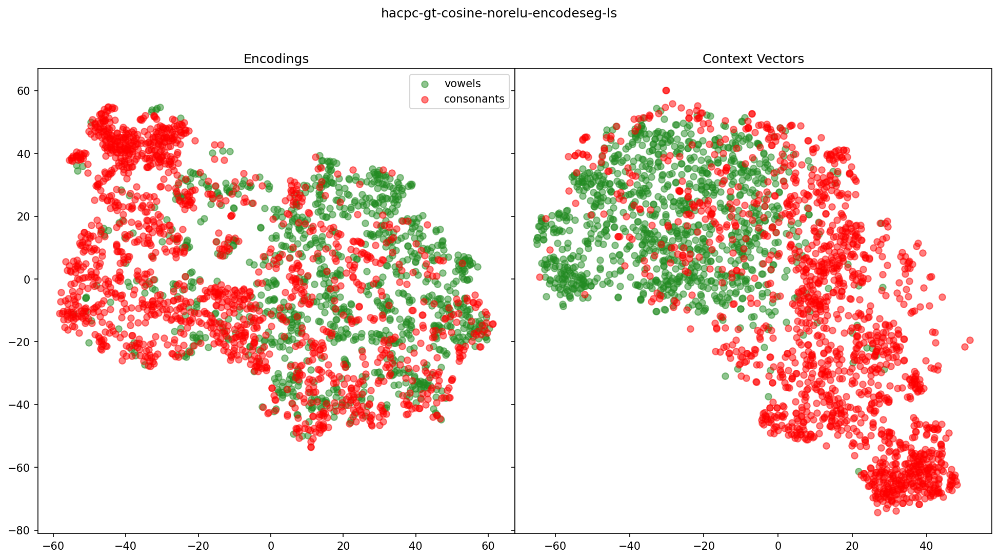

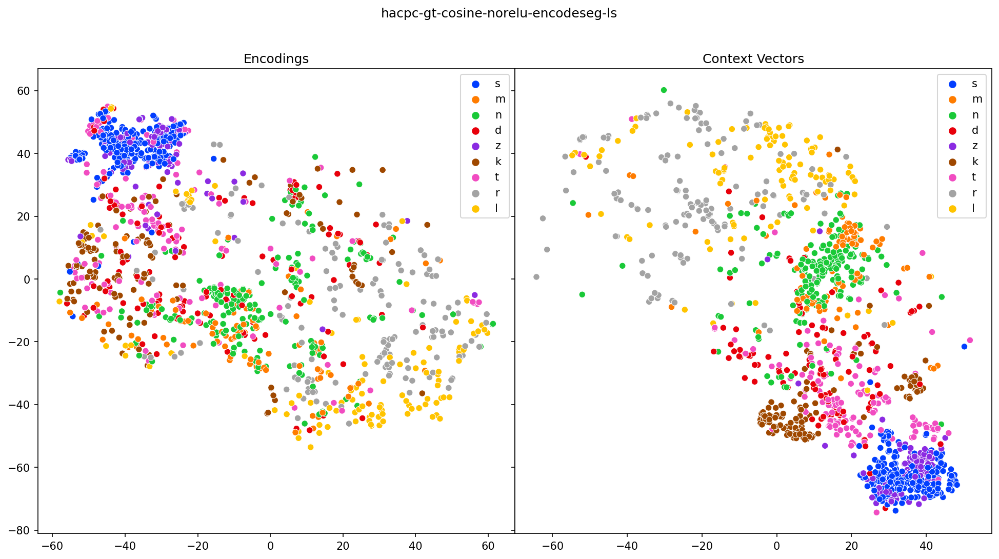

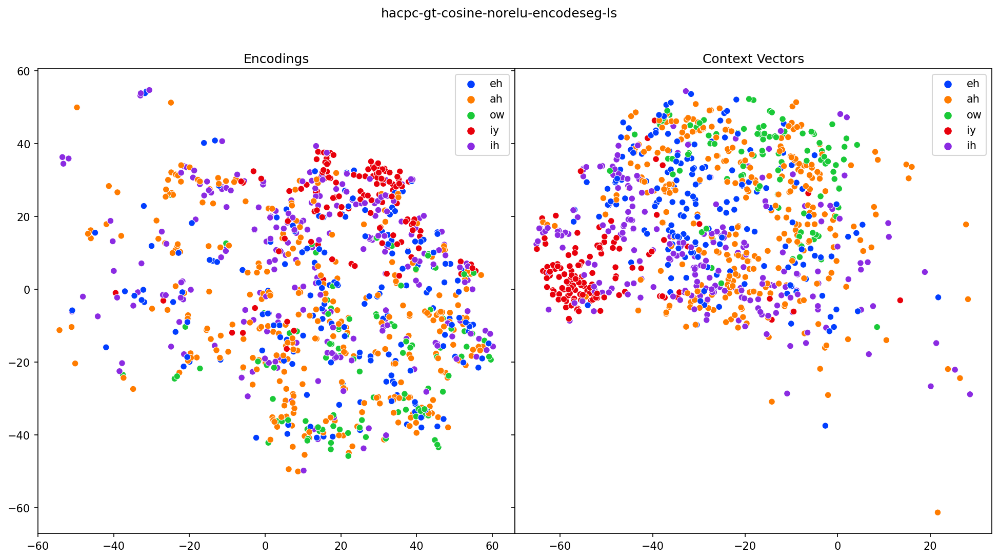

In [13]:
for mod in AR_models:
    CP = '/pio/scratch/1/i325922/wav2vec/runs/cpc/' + mod + '/checkpoint_49.pt'
    context_enc_tsne = torch.load("./tsne_tensors/" + mod + "_context_encodingsTsne.pt")
    enc_tsne = torch.load("./tsne_tensors/" + mod + "_encodingsTsne.pt")
    avg_context_enc_tsne = torch.load("./tsne_tensors/" + mod + "_avgcontext_encodingsTsne.pt")
    avg_enc_tsne = torch.load("./tsne_tensors/" + mod + "_avg_encodingsTsne.pt")
 

    print("\n")
    print("Full Resolution Frames")
    print("-" * 50)
    print("\n")

    # full resolution
    plot_cons_vows_comp(enc_tsne, context_enc_tsne, labels, codes2phones, mod)
    plot_clustered_vows_n_cons(enc_tsne, context_enc_tsne, labels, codes2phones, mod)

    print("\n")
    print("Averaged Segments")
    print("-" * 50)
    print("\n")

    # averaged segments
    plot_cons_vows_comp(avg_enc_tsne, avg_context_enc_tsne, avgLabels, codes2phones, mod)
    plot_clustered_vows_n_cons(avg_enc_tsne, avg_context_enc_tsne, avgLabels, codes2phones, mod, avg=True)